In [1]:
import pandas as pd
import numpy as np
import re
import spacy
import matplotlib.pyplot as plt
from wordcloud import WordCloud,STOPWORDS

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Data Extraction from various ecommerce websites 

In [3]:
# for sentimental analysis let import the dataset we extrcat from the different ecommerce websites
df=pd.read_csv("iphonecompletedata.csv")
df.head

<bound method NDFrame.head of        Unnamed: 0  index                                             REVIEW
0               0      0  good phone but wrost prize reduction.. its my ...
1               1      1  Absolutely amazing device. It's actually my fi...
2               2      2  Always wanted to buy iphone 4s; because of its...
3               3      3  this is my 2nd iPhone previous one iPhone 3gs ...
4               4      4  yes . .its old. . .its discontinued?????? I do...
...           ...    ...                                                ...
27463       27463  27463                                               21st
27464       27464  27464                                            Boo yao
27465       27465  27465                                        Dum i think
27466       27466  27466                                      @MegaWooj 86 
27467       27467  27467  yo u got th at off the siri website im not lik...

[27468 rows x 3 columns]>

In [4]:
df1=pd.DataFrame(df)
df1.head()

,Unnamed: 0,index,REVIEW
0,0,0,good phone but wrost prize reduction.. its my ...
1,1,1,Absolutely amazing device. It's actually my fi...
2,2,2,Always wanted to buy iphone 4s; because of its...
3,3,3,this is my 2nd iPhone previous one iPhone 3gs ...
4,4,4,yes . .its old. . .its discontinued?????? I do...


In [5]:
len(df1)

27468

In [6]:
# remove the unnamed column
df1.drop('index',axis=1,inplace=True)
df1

,Unnamed: 0,REVIEW
0,0,good phone but wrost prize reduction.. its my ...
1,1,Absolutely amazing device. It's actually my fi...
2,2,Always wanted to buy iphone 4s; because of its...
3,3,this is my 2nd iPhone previous one iPhone 3gs ...
4,4,yes . .its old. . .its discontinued?????? I do...
...,...,...
27463,27463,21st
27464,27464,Boo yao
27465,27465,Dum i think
27466,27466,@MegaWooj 86


In [7]:
df1.drop('Unnamed: 0',axis=1,inplace=True)

In [8]:
df1.head()

,REVIEW
0,good phone but wrost prize reduction.. its my ...
1,Absolutely amazing device. It's actually my fi...
2,Always wanted to buy iphone 4s; because of its...
3,this is my 2nd iPhone previous one iPhone 3gs ...
4,yes . .its old. . .its discontinued?????? I do...


In [9]:
import textblob
from textblob import TextBlob

In [10]:
# lets check for the duplicates
df1.duplicated().shape

(27468,)

In [11]:
(df1.drop_duplicates()).reset_index(drop=True)
df1

,REVIEW
0,good phone but wrost prize reduction.. its my ...
1,Absolutely amazing device. It's actually my fi...
2,Always wanted to buy iphone 4s; because of its...
3,this is my 2nd iPhone previous one iPhone 3gs ...
4,yes . .its old. . .its discontinued?????? I do...
...,...
27463,21st
27464,Boo yao
27465,Dum i think
27466,@MegaWooj 86


In [12]:
df1.rename(columns={'REVIEW':'review'},inplace=True)
df1

,review
0,good phone but wrost prize reduction.. its my ...
1,Absolutely amazing device. It's actually my fi...
2,Always wanted to buy iphone 4s; because of its...
3,this is my 2nd iPhone previous one iPhone 3gs ...
4,yes . .its old. . .its discontinued?????? I do...
...,...
27463,21st
27464,Boo yao
27465,Dum i think
27466,@MegaWooj 86


# Data Cleaning

In [13]:
# lets clean the data and remove all the punctuation and all special characters
import string
def clean_reviews(review):
    'make thetext lower case,remove the squarebrackets,remove the text in punctuations and special characters'
   # review=review.lower()
    review=re.sub('\[.*?\]','',str(review))
    review=re.sub('[%s]'%re.escape(string.punctuation),'',str(review))
    review=re.sub('\w*\d\w*','',str(review))
    review = re.sub("[0-9" "]+"," ",str(review))
    review = re.sub('[‘’“”…]', '', str(review))
    review=re.sub('https:\ $',' ',str(review))
    review=re.sub(" _'_ ",' ',str(review))
    review = re.sub('a{3}','',review)
    review=re.sub("[^A-Za-z" "]+"," ",review).lower()
    return(review)
clean=lambda x : clean_reviews(x)

In [14]:
df1['review'] =df1.review.apply(clean)
df1

,review
0,good phone but wrost prize reduction its my re...
1,absolutely amazing device its actually my firs...
2,always wanted to buy iphone because of its gre...
3,this is my iphone previous one iphone now ya t...
4,yes its old its discontinued i dont think so e...
...,...
27463,
27464,boo yao
27465,dum i think
27466,megawooj


In [15]:
# lets count the word frequency
word_freq=pd.Series(" ".join(df1['review']).split()).value_counts()[:20]
word_freq

the       33541
i         27831
and       22266
to        20750
is        20341
it        19887
a         16843
iphone    14445
phone     13424
of        11203
for       10105
this      10074
you        9398
in         9334
my         9050
that       7636
with       7485
have       7204
but        7189
not        6820
dtype: int64

In [16]:
# lets join the review into paragargh
df1_para=" ".join(df1['review'])
df1_para

'good phone but wrost prize reduction its my review if you like to post it go ahead otherwise delete it i cant fabricated words for enrich fkread more absolutely amazing device its actually my first ios device and everything just works no lags no issues whatsoever camera is brilliant takes much better pictures than expected especially for the price there are android devices with quad core chips and large hd displays in this price range but you should go by experience and not just raw specs even though this has much inferior chipset and only mb ram the ui is butter smooth and there is no stuttering or lag anywherethe display is on the smaller side at but very accurate and thanks to the density it looks super sharp overall highly recommended to those who want a phone that just works well all the time has a brilliant camera and can live with the smaller screenread more always wanted to buy iphone because of its great looking glass backpun intendednever liked tv like mobile phones with big

In [17]:
# lets remove rhe unwanted characters
df1_para=re.sub("[^A-Za-z" "]+"," ",df1_para).lower()
df1_para=re.sub("[0-9" "]+"," ",df1_para)

In [18]:
df1_para

'good phone but wrost prize reduction its my review if you like to post it go ahead otherwise delete it i cant fabricated words for enrich fkread more absolutely amazing device its actually my first ios device and everything just works no lags no issues whatsoever camera is brilliant takes much better pictures than expected especially for the price there are android devices with quad core chips and large hd displays in this price range but you should go by experience and not just raw specs even though this has much inferior chipset and only mb ram the ui is butter smooth and there is no stuttering or lag anywherethe display is on the smaller side at but very accurate and thanks to the density it looks super sharp overall highly recommended to those who want a phone that just works well all the time has a brilliant camera and can live with the smaller screenread more always wanted to buy iphone because of its great looking glass backpun intendednever liked tv like mobile phones with big

In [19]:
# lets remove the stopwords and checking its count
from nltk.corpus import stopwords
stop=stopwords.words('english')
df1['review']=df1['review'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
df1['stopwords']= df1['review'].apply(lambda x: len([x for x in x.split() if x in stop]))
df1[['review','stopwords']].head()

,review,stopwords
0,good phone wrost prize reduction review like p...,0
1,absolutely amazing device actually first ios d...,0
2,always wanted buy iphone great looking glass b...,0
3,iphone previous one iphone ya cost high demand...,0
4,yes old discontinued dont think everyone told ...,0


In [20]:
df1['stopwords'].value_counts()

0    27468
Name: stopwords, dtype: int64

In [21]:
from nltk.corpus import stopwords
stop = stopwords.words('english')
stop.append('blah')
stop.append('read')
stop.append('full')
stop.append('review')
stop.append('top')
stop.append('plz')
stop.append('help')
df1['review'] = df1['review'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

In [22]:
other_stop_words = ['I','one','use','get','2012','would','still','also','got','go','im','even','u','know','4','5','life','2','6','blah','ur','read','lol']


In [23]:
df1['clean_review'] = df1['review'].apply(lambda x:" ".join(word for word in x.split() if word not in other_stop_words))

In [24]:
df1.head()

,review,stopwords,clean_review
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...
1,absolutely amazing device actually first ios d...,0,absolutely amazing device actually first ios d...
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...


In [25]:
# lets tokenise the words
TextBlob(df1['review'][1]).words

WordList(['absolutely', 'amazing', 'device', 'actually', 'first', 'ios', 'device', 'everything', 'works', 'lags', 'issues', 'whatsoever', 'camera', 'brilliant', 'takes', 'much', 'better', 'pictures', 'expected', 'especially', 'price', 'android', 'devices', 'quad', 'core', 'chips', 'large', 'hd', 'displays', 'price', 'range', 'go', 'experience', 'raw', 'specs', 'even', 'though', 'much', 'inferior', 'chipset', 'mb', 'ram', 'ui', 'butter', 'smooth', 'stuttering', 'lag', 'anywherethe', 'display', 'smaller', 'side', 'accurate', 'thanks', 'density', 'looks', 'super', 'sharp', 'overall', 'highly', 'recommended', 'want', 'phone', 'works', 'well', 'time', 'brilliant', 'camera', 'live', 'smaller', 'screenread'])

In [26]:
# lets count the wrod frequnecy by removing stopwords
wfrq_wostop=pd.Series(' '.join(df1['review']).split()).value_counts()[:20]
#wfrq_wostop_frame=pd.DataFrame(wfrq_wostop)
wfrq_wostop

iphone     14445
phone      13424
apple       6685
good        4314
like        3634
one         3569
use         3046
love        2787
dont        2659
great       2627
android     2459
battery     2443
buy         2413
best        2401
get         2383
new         2267
better      2224
ios         1984
product     1932
would       1922
dtype: int64

In [27]:
df1['wfeq_wostop'] = df1['review'].apply(lambda x:" ".join(word for word in x.split()))# if word not in other_stop_words))
df1.head()

,review,stopwords,clean_review,wfeq_wostop
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...
1,absolutely amazing device actually first ios d...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...


In [28]:
# lets check for the unqiue words
df1_uniq=list(set(" ".join(df1['review']).split(" ")))
df1_uniq_WORDS=pd.DataFrame(df1_uniq)
df1_uniq_WORDS

,0
0,
1,illumination
2,lool
3,moneyin
4,wooyoung
...,...
27849,undestand
27850,flipmart
27851,lostread
27852,gh


In [29]:
import nltk
from nltk import word_tokenize,wordpunct_tokenize

In [30]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Hp\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [31]:
#lets do lemmatatinzation
from textblob import Word

df1['review']=df1['review'].apply(lambda x: ' '.join([Word(word).lemmatize() for word in x.split()]))
df1['review'].head()

0    good phone wrost prize reduction like post go ...
1    absolutely amazing device actually first io de...
2    always wanted buy iphone great looking glass b...
3    iphone previous one iphone ya cost high demand...
4    yes old discontinued dont think everyone told ...
Name: review, dtype: object

In [32]:
# lets go for stemming
#from nltk.stem.porter import PorterStemmer
#ps=PorterStemmer()
#df1['review']=df1['review'].apply(lambda x:' '.join(ps.stem(word) for word in x.split()))
#df1['review']

In [33]:
#from nltk.stem.porter import PorterStemmer
#ps=PorterStemmer()
#df1_para1=[ps.stem(word) for word in df1_para]
#print(df1_para1[0:100])

In [34]:
#lets do lemmatatinzation
from textblob import Word

df1_para1=([Word(word).lemmatize() for word in df1_para])
df1_para1

['g',
 'o',
 'o',
 'd',
 ' ',
 'p',
 'h',
 'o',
 'n',
 'e',
 ' ',
 'b',
 'u',
 't',
 ' ',
 'w',
 'r',
 'o',
 's',
 't',
 ' ',
 'p',
 'r',
 'i',
 'z',
 'e',
 ' ',
 'r',
 'e',
 'd',
 'u',
 'c',
 't',
 'i',
 'o',
 'n',
 ' ',
 'i',
 't',
 's',
 ' ',
 'm',
 'y',
 ' ',
 'r',
 'e',
 'v',
 'i',
 'e',
 'w',
 ' ',
 'i',
 'f',
 ' ',
 'y',
 'o',
 'u',
 ' ',
 'l',
 'i',
 'k',
 'e',
 ' ',
 't',
 'o',
 ' ',
 'p',
 'o',
 's',
 't',
 ' ',
 'i',
 't',
 ' ',
 'g',
 'o',
 ' ',
 'a',
 'h',
 'e',
 'a',
 'd',
 ' ',
 'o',
 't',
 'h',
 'e',
 'r',
 'w',
 'i',
 's',
 'e',
 ' ',
 'd',
 'e',
 'l',
 'e',
 't',
 'e',
 ' ',
 'i',
 't',
 ' ',
 'i',
 ' ',
 'c',
 'a',
 'n',
 't',
 ' ',
 'f',
 'a',
 'b',
 'r',
 'i',
 'c',
 'a',
 't',
 'e',
 'd',
 ' ',
 'w',
 'o',
 'r',
 'd',
 's',
 ' ',
 'f',
 'o',
 'r',
 ' ',
 'e',
 'n',
 'r',
 'i',
 'c',
 'h',
 ' ',
 'f',
 'k',
 'r',
 'e',
 'a',
 'd',
 ' ',
 'm',
 'o',
 'r',
 'e',
 ' ',
 'a',
 'b',
 's',
 'o',
 'l',
 'u',
 't',
 'e',
 'l',
 'y',
 ' ',
 'a',
 'm',
 'a',
 'z',
 'i',
 'n'

In [35]:
# lets use count vectorzier to check the frequency of the words
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
vect=CountVectorizer(min_df=1,max_df=0.8)
X=vect.fit_transform(df1['review'])
w_f_df=pd.DataFrame({'term':vect.get_feature_names_out(),'occurances':np.asarray(X.sum(axis=0)).ravel().tolist()})
w_f_df['frequencies']=w_f_df['occurances']/np.sum(w_f_df['occurances'])

In [36]:
w_f_df.head()

,term,occurances,frequencies
0,aa,4,0.000009
1,aaa,1,0.000002
2,aaaamaaaaaziiiiiiinnnnnngggggg,1,0.000002
3,aaadeals,2,0.000004
4,aadarsh,1,0.000002


In [37]:
# lets sort it in the ascending order
w_f_df.sort_values(by='occurances',ascending=True)

,term,occurances,frequencies
13131,llcbecause,1,0.000002
14912,multitaskingomg,1,0.000002
14911,multitaskingnni,1,0.000002
14908,multitasker,1,0.000002
14907,multitaske,1,0.000002
...,...,...,...
15993,one,3733,0.008209
9322,good,4320,0.009500
1176,apple,6984,0.015359
11617,iphone,14445,0.031766


# Data Processing

# sentimental analysis using Text blob

In [38]:
# lest get the subjectivity ad polarity of the review
def sentimental_analysis(df1):
    sentiment=TextBlob(df1['review']).sentiment
    return pd.Series([sentiment.subjectivity,sentiment.polarity])
df1[['subjectivity','polarity']]=df1.apply(sentimental_analysis,axis=1)

df1

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972
...,...,...,...,...,...,...
27463,,0,,,0.000000,0.000000
27464,boo yao,0,boo yao,boo yao,0.000000,0.000000
27465,dum think,0,dum think,dum think,0.000000,0.000000
27466,megawooj,0,megawooj,megawooj,0.000000,0.000000


# sentimental analysis using Vader Lexicon

In [39]:
df_vader=df1


In [40]:
df_vader.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972


In [41]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [42]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
SIA=SentimentIntensityAnalyzer()
df_vader['sentiments_vader']=df_vader['review'].apply(lambda x:SIA.polarity_scores(x))
df_vader=pd.concat([df_vader.drop(['sentiments_vader'],axis=1),df_vader['sentiments_vader'].apply(pd.Series)],axis=1)

In [43]:
df_vader.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,neg,neu,pos,compound
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,0.000,0.599,0.401,0.8271
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,0.104,0.607,0.289,0.9543
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,0.061,0.659,0.280,0.9923
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,0.038,0.660,0.302,0.9906
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,0.032,0.671,0.297,0.9944


In [44]:
# add number of character column
df_vader['nb_chars']=df_vader['review'].apply(lambda x : len(x))
df_vader.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,neg,neu,pos,compound,nb_chars
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,0.000,0.599,0.401,0.8271,103
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,0.104,0.607,0.289,0.9543,478
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,0.061,0.659,0.280,0.9923,1087
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,0.038,0.660,0.302,0.9906,747
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,0.032,0.671,0.297,0.9944,1112


In [45]:
# add number of word_cloumns
df_vader['nb_words']=df_vader['review'].apply(lambda x :len(x.split(" ")))
df_vader.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,neg,neu,pos,compound,nb_chars,nb_words
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,0.000,0.599,0.401,0.8271,103,16
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,0.104,0.607,0.289,0.9543,478,70
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,0.061,0.659,0.280,0.9923,1087,157
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,0.038,0.660,0.302,0.9906,747,123
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,0.032,0.671,0.297,0.9944,1112,166


In [46]:
df_vader.rename(columns={'neg':'neg_senti_scre','neu':'neu_senti_scre','pos':'pos_senti_scre'},inplace=True)
df_vader

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,neg_senti_scre,neu_senti_scre,pos_senti_scre,compound,nb_chars,nb_words
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,0.000,0.599,0.401,0.8271,103,16
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,0.104,0.607,0.289,0.9543,478,70
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,0.061,0.659,0.280,0.9923,1087,157
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,0.038,0.660,0.302,0.9906,747,123
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,0.032,0.671,0.297,0.9944,1112,166
...,...,...,...,...,...,...,...,...,...,...,...,...
27463,,0,,,0.000000,0.000000,0.000,0.000,0.000,0.0000,0,1
27464,boo yao,0,boo yao,boo yao,0.000000,0.000000,0.000,1.000,0.000,0.0000,7,2
27465,dum think,0,dum think,dum think,0.000000,0.000000,0.000,1.000,0.000,0.0000,9,2
27466,megawooj,0,megawooj,megawooj,0.000000,0.000000,0.000,1.000,0.000,0.0000,8,1


# Analysing

# Analysis of the sentiment score of the review when TextBlob used

In [47]:
#lets do the analysis of the text  values obtained
def analysis(score):
    if score>0:
        return('Positive_txtscre')
    elif score==0:
          return('Netural_txtscre')
    else:
         return('Negative_txtscre')

In [48]:
df1['analysis_sentence']=df1['polarity'].apply(analysis)
df1

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,sentiments_vader,analysis_sentence
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,"{'neg': 0.0, 'neu': 0.599, 'pos': 0.401, 'comp...",Positive_txtscre
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,"{'neg': 0.104, 'neu': 0.607, 'pos': 0.289, 'co...",Positive_txtscre
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,"{'neg': 0.061, 'neu': 0.659, 'pos': 0.28, 'com...",Positive_txtscre
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,"{'neg': 0.038, 'neu': 0.66, 'pos': 0.302, 'com...",Positive_txtscre
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,"{'neg': 0.032, 'neu': 0.671, 'pos': 0.297, 'co...",Positive_txtscre
...,...,...,...,...,...,...,...,...
27463,,0,,,0.000000,0.000000,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",Netural_txtscre
27464,boo yao,0,boo yao,boo yao,0.000000,0.000000,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Netural_txtscre
27465,dum think,0,dum think,dum think,0.000000,0.000000,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Netural_txtscre
27466,megawooj,0,megawooj,megawooj,0.000000,0.000000,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Netural_txtscre


In [49]:
from sklearn.preprocessing import LabelEncoder
lm=LabelEncoder()
df1['analysis_sentence']=lm.fit_transform(df1['analysis_sentence'])
df1.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,sentiments_vader,analysis_sentence
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,"{'neg': 0.0, 'neu': 0.599, 'pos': 0.401, 'comp...",2
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,"{'neg': 0.104, 'neu': 0.607, 'pos': 0.289, 'co...",2
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,"{'neg': 0.061, 'neu': 0.659, 'pos': 0.28, 'com...",2
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,"{'neg': 0.038, 'neu': 0.66, 'pos': 0.302, 'com...",2
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,"{'neg': 0.032, 'neu': 0.671, 'pos': 0.297, 'co...",2


In [50]:
import matplotlib.pyplot as plt

In [51]:
names={'Positive_textscre','Netural_txtscre','Negative_txtscre'}

In [52]:
#plt.pie(df1.analysis_sentence,labels=df1.analysis_sentence.values)
#plt.show()

In [53]:
df1.analysis_sentence.value_counts()

2    17316
1     6729
0     3423
Name: analysis_sentence, dtype: int64

# highest positive sentiment reviews(with more than 500 words)

In [54]:
df_vader[df_vader["nb_words"]>200].sort_values("pos_senti_scre",ascending=False)[["review","pos_senti_scre"]].head(2)

,review,pos_senti_scre
168,thanks w retail product delivered quickly requ...,0.349
22695,guy writing since there always much talk andro...,0.247


In [55]:
df_vader.loc[11724]

review            nice easy carry good also love love phone good...
stopwords                                                         0
clean_review      nice easy carry good love love phone good nice...
wfeq_wostop       nice easy carry good also love love phone good...
subjectivity                                               0.766667
polarity                                                    0.60303
neg_senti_scre                                                  0.0
neu_senti_scre                                                0.198
pos_senti_scre                                                0.802
compound                                                     0.9876
nb_chars                                                        114
nb_words                                                         21
Name: 11724, dtype: object

In [56]:
# least negative sentiment reviews(with more than 6 words)
df_vader[df_vader["nb_words"] > 200].sort_values("neg_senti_scre",ascending=False)[["review","neg_senti_scre"]].head(2)


,review,neg_senti_scre
18771,apr iphonethis one didnt buy sane old issue li...,0.138
33,dualcore cortex cpu fab poor battery ram lol m...,0.127


In [57]:
df_vader["neg_senti_scre"].value_counts()

0.000    17485
0.083      155
0.087       94
0.058       92
0.060       91
         ...  
0.558        1
0.581        1
0.539        1
0.546        1
0.465        1
Name: neg_senti_scre, Length: 611, dtype: int64

# Feature Extraction 

#  using TFIDF

In [58]:
#lets perform TDFIF method for textblob data
from sklearn.feature_extraction.text import TfidfVectorizer
vect_tdif=TfidfVectorizer(max_features=100,max_df=0.5,stop_words='english',smooth_idf=True)
doc_tidf=vect_tdif.fit_transform(df1['review'])
naming_features=vect_tdif.get_feature_names()
dense=doc_tidf.todense()
denselist=dense.tolist()
df2=pd.DataFrame(denselist,columns=naming_features)

In [59]:
df2

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,user,using,verizon,video,want,way,work,working,year,yes
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.0,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.0,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27464,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27465,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27466,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000


# N grams

In [60]:
# bi-grams 
def get_top2_words(corpus,n=None):
    vector=CountVectorizer(ngram_range=(2,2),
                           max_features=2000).fit(corpus)
    bag_of_words=vector.transform(corpus)
    sum_words=bag_of_words.sum(axis=0)
    words_freq=[(word,sum_words[0,idx]) for word,idx in vector.vocabulary_.items()]
    words_freq= sorted(words_freq,key= lambda x: x[1],reverse=True)
    return words_freq[:n]


In [61]:
top2_words = get_top2_words(df1["review"], n=200)
top2_words_df=pd.DataFrame(top2_words)
top2_words_df.columns=["Bigram","freq"]
top2_words_df.head()

,Bigram,freq
0,battery life,698
1,apple product,633
2,apple iphone,569
3,great phone,526
4,best phone,520


[Text(0, 0, 'battery life'),
 Text(1, 0, 'apple product'),
 Text(2, 0, 'apple iphone'),
 Text(3, 0, 'great phone'),
 Text(4, 0, 'best phone'),
 Text(5, 0, 'good phone'),
 Text(6, 0, 'love iphone'),
 Text(7, 0, 'easy use'),
 Text(8, 0, 'samsung galaxy'),
 Text(9, 0, 'buy iphone'),
 Text(10, 0, 'android phone'),
 Text(11, 0, 'love phone'),
 Text(12, 0, 'iphone iphone'),
 Text(13, 0, 'dont know'),
 Text(14, 0, 'first iphone'),
 Text(15, 0, 'much better'),
 Text(16, 0, 'new iphone'),
 Text(17, 0, 'love apple'),
 Text(18, 0, 'smart phone'),
 Text(19, 0, 'sim card')]

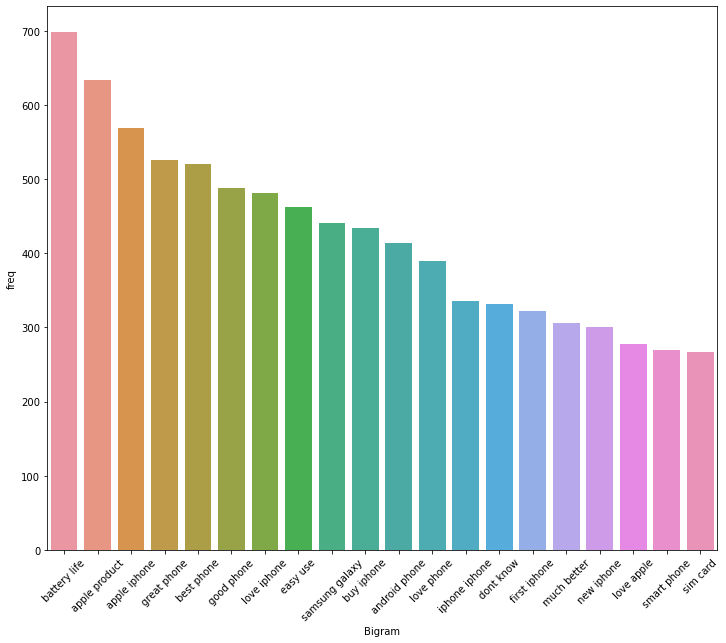

In [62]:
# bigram plot
import matplotlib.pyplot as plt
import seaborn as sns
top20_bigram=top2_words_df.iloc[0:20,:]
fig=plt.figure(figsize=(12,10))
plot=sns.barplot(x=top20_bigram["Bigram"],y=top20_bigram["freq"])
plot.set_xticklabels(rotation=45,labels=top20_bigram["Bigram"])

In [63]:
#Tri grams
def get_top3_words(corpus,n=None):
    vector=CountVectorizer(ngram_range=(3,3),max_features=2000).fit(corpus)
    bag_of_words=vector.transform(corpus)
    sum_words=bag_of_words.sum(axis=0)
    words_freq=[(word,sum_words[0,idx]) for word ,idx in vector.vocabulary_.items()]
    words_freq=sorted(words_freq,key=lambda x:x[1],reverse=True)
    return words_freq[:n]
    


In [64]:
top30_words=get_top3_words(df1["review"],n=200)
top30_df=pd.DataFrame(top30_words)
top30_df.columns=["Trigram","freq"]
top30_df.head()

,Trigram,freq
0,best phone ever,153
1,love apple product,113
2,international gsm capability,104
3,iphone samsung galaxy,71
4,iphone best phone,68


[Text(0, 0, 'best phone ever'),
 Text(1, 0, 'love apple product'),
 Text(2, 0, 'international gsm capability'),
 Text(3, 0, 'iphone samsung galaxy'),
 Text(4, 0, 'iphone best phone'),
 Text(5, 0, 'phone first iphone'),
 Text(6, 0, 'make phone call'),
 Text(7, 0, 'really great phone'),
 Text(8, 0, 'really love phone'),
 Text(9, 0, 'never go back'),
 Text(10, 0, 'dual core processor'),
 Text(11, 0, 'like brand new'),
 Text(12, 0, 'hate iti hate'),
 Text(13, 0, 'please tell apple'),
 Text(14, 0, 'iti hate iti'),
 Text(15, 0, 'apple make new'),
 Text(16, 0, 'sim card buy'),
 Text(17, 0, 'love phone first'),
 Text(18, 0, 'phone everything work'),
 Text(19, 0, 'phone easy use'),
 Text(20, 0, 'work look like'),
 Text(21, 0, 'new sim card'),
 Text(22, 0, 'look like brand'),
 Text(23, 0, 'could bring phone'),
 Text(24, 0, 'slot sim card'),
 Text(25, 0, 'using ipod touch'),
 Text(26, 0, 'use phone without'),
 Text(27, 0, 'happy phone everything'),
 Text(28, 0, 'network using sim'),
 Text(29, 0, 

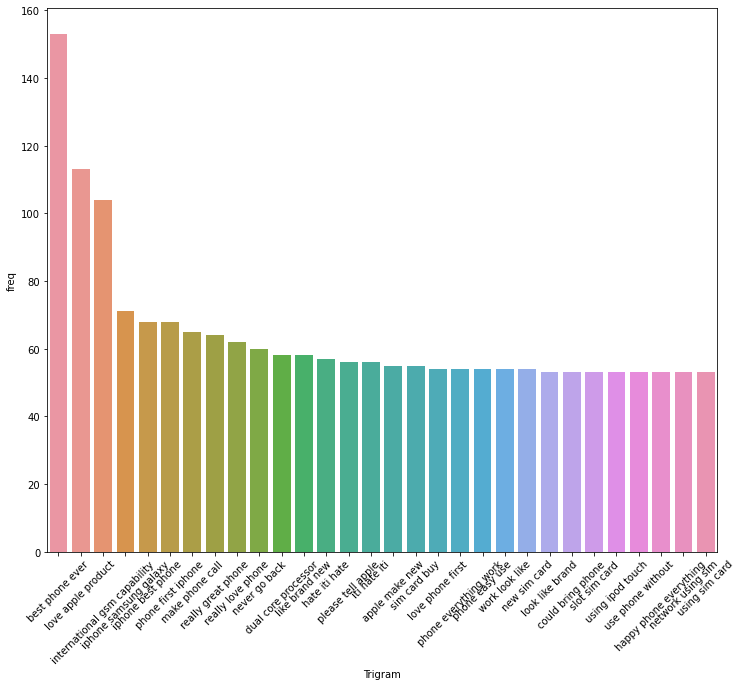

In [65]:
# ploting n-grams
top30_words=top30_df.iloc[0:30,:]
fig=plt.figure(figsize=(12,10))
plot=sns.barplot(x=top30_words["Trigram"],y=top30_words["freq"])
plot.set_xticklabels(rotation=45,labels=top30_words["Trigram"])

# sentimental Analysis using Affin lexicon

# importing Affin dataset

In [66]:
affin=pd.read_csv("Afinn.csv.xls")

In [67]:
affin.head()

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2


In [68]:
words=[]
for i in affin.word:
    j=i.split('\t')
    words.append(j[0])
words

['abandon',
 'abandoned',
 'abandons',
 'abducted',
 'abduction',
 'abductions',
 'abhor',
 'abhorred',
 'abhorrent',
 'abhors',
 'abilities',
 'ability',
 'aboard',
 'absentee',
 'absentees',
 'absolve',
 'absolved',
 'absolves',
 'absolving',
 'absorbed',
 'abuse',
 'abused',
 'abuses',
 'abusive',
 'accept',
 'accepted',
 'accepting',
 'accepts',
 'accident',
 'accidental',
 'accidentally',
 'accidents',
 'accomplish',
 'accomplished',
 'accomplishes',
 'accusation',
 'accusations',
 'accuse',
 'accused',
 'accuses',
 'accusing',
 'ache',
 'achievable',
 'aching',
 'acquit',
 'acquits',
 'acquitted',
 'acquitting',
 'acrimonious',
 'active',
 'adequate',
 'admire',
 'admired',
 'admires',
 'admiring',
 'admit',
 'admits',
 'admitted',
 'admonish',
 'admonished',
 'adopt',
 'adopts',
 'adorable',
 'adore',
 'adored',
 'adores',
 'advanced',
 'advantage',
 'advantages',
 'adventure',
 'adventures',
 'adventurous',
 'affected',
 'affection',
 'affectionate',
 'afflicted',
 'affronted',

In [69]:
affin["words"]=words
affin.head(10)

,word,value,words
0,abandon,-2,abandon
1,abandoned,-2,abandoned
2,abandons,-2,abandons
3,abducted,-2,abducted
4,abduction,-2,abduction
5,abductions,-2,abductions
6,abhor,-3,abhor
7,abhorred,-3,abhorred
8,abhorrent,-3,abhorrent
9,abhors,-3,abhors


In [70]:
affinity_scores=affin.set_index(["words"])["value"].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [71]:
nlp = spacy.load("en_core_web_sm")
sentiment_lexicon = affinity_scores

def calculate_sentiment(text: str = None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_, 0)
    return sent_score

In [72]:
#df1['sentiment_score'] =df1['review'].apply(calculate_sentiment)

In [73]:
df1['sentimental_scores']=df1['review'].apply(calculate_sentiment)
df1.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,sentiments_vader,analysis_sentence,sentimental_scores
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,"{'neg': 0.0, 'neu': 0.599, 'pos': 0.401, 'comp...",2,5
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,"{'neg': 0.104, 'neu': 0.607, 'pos': 0.289, 'co...",2,16
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,"{'neg': 0.061, 'neu': 0.659, 'pos': 0.28, 'com...",2,41
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,"{'neg': 0.038, 'neu': 0.66, 'pos': 0.302, 'com...",2,23
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,"{'neg': 0.032, 'neu': 0.671, 'pos': 0.297, 'co...",2,27


In [74]:
df1["word_counts"]=df1["review"].str.split().apply(len)
df1["word_counts"]

0         16
1         70
2        157
3        123
4        166
        ... 
27463      0
27464      2
27465      2
27466      1
27467     12
Name: word_counts, Length: 27468, dtype: int64

<AxesSubplot:xlabel='sentimental_scores', ylabel='Density'>

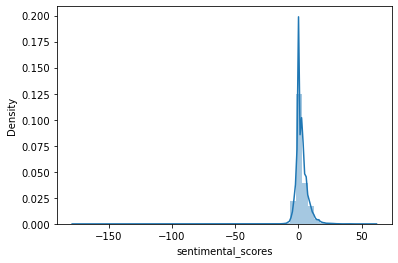

In [75]:
import seaborn as sns
sns.distplot(df1["sentimental_scores"])

In [76]:
df1.sentimental_scores.min()

-177

In [77]:
df1.sentimental_scores.max()

60

In [78]:
df1['Sentiment_Class'] = pd.cut(x=df1['sentimental_scores'],bins=[-976, -1, 0, 128], 
                                    labels=['Negative','Neutral','Positive'], right = True)

In [79]:
df1.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,sentiments_vader,analysis_sentence,sentimental_scores,word_counts,Sentiment_Class
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,"{'neg': 0.0, 'neu': 0.599, 'pos': 0.401, 'comp...",2,5,16,Positive
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,"{'neg': 0.104, 'neu': 0.607, 'pos': 0.289, 'co...",2,16,70,Positive
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,"{'neg': 0.061, 'neu': 0.659, 'pos': 0.28, 'com...",2,41,157,Positive
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,"{'neg': 0.038, 'neu': 0.66, 'pos': 0.302, 'com...",2,23,123,Positive
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,"{'neg': 0.032, 'neu': 0.671, 'pos': 0.297, 'co...",2,27,166,Positive


In [80]:
df1['Sentiment_Class'].value_counts()

Positive    15846
Neutral      7655
Negative     3967
Name: Sentiment_Class, dtype: int64

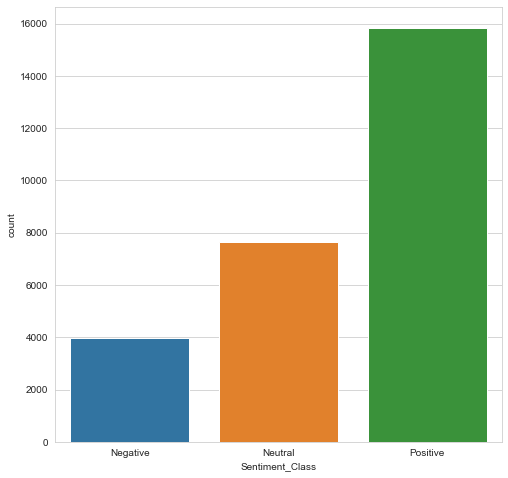

In [81]:
plt.figure(figsize=(8,8))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Class", data=df1)

# Catergorical encoding Technique

# using Label encoder for the dataset

In [82]:
from sklearn.preprocessing import LabelEncoder

In [83]:
lm=LabelEncoder()
df2["Sentiment_Class"]=lm.fit_transform(df1["Sentiment_Class"])
df2.head()

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,using,verizon,video,want,way,work,working,year,yes,Sentiment_Class
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,2
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000,2
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726,2
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000,2
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658,2


# Model Building 

In [84]:
X=df2.iloc[:,:-1]
X

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,user,using,verizon,video,want,way,work,working,year,yes
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.0,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.0,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27464,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27465,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27466,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000


In [85]:
Y=df2.iloc[:,-1:]
Y

,Sentiment_Class
0,2
1,2
2,2
3,2
4,2
...,...
27463,1
27464,1
27465,1
27466,1


# Decision tree

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score as ac
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 0.2) 

In [87]:
X_train.shape

(21974, 100)

In [88]:
X.shape

(27468, 100)

In [89]:
Y.shape

(27468, 1)

In [90]:
y_train.shape

(21974, 1)

In [91]:
model=DecisionTreeClassifier( criterion='gini', min_samples_split=5)
model=model.fit(X_train,y_train)

In [92]:
y_pred=model.predict(X_test)

In [93]:
accuracy_decision=ac(y_test,y_pred)
accuracy_decision

0.7029486712777575

# Logistic Regression

In [94]:
classifier=LogisticRegression(max_iter=2000)
classifier.fit(X_train,y_train)

LogisticRegression(max_iter=2000)

In [95]:
y_pred_logistic=classifier.predict(X_test)
y_pred_logistic

array([1, 2, 2, ..., 2, 2, 1])

In [96]:
accuracy_logistic=ac(y_pred_logistic,y_test)
accuracy_logistic

0.7442664725154714

In [97]:
from sklearn.metrics import confusion_matrix
confusion_matrix (y_pred_logistic,y_test)

array([[ 217,   60,   70],
       [ 319, 1211,  451],
       [ 269,  236, 2661]], dtype=int64)

In [98]:
print(classification_report(y_pred_logistic,y_test))

              precision    recall  f1-score   support

           0       0.27      0.63      0.38       347
           1       0.80      0.61      0.69      1981
           2       0.84      0.84      0.84      3166

    accuracy                           0.74      5494
   macro avg       0.64      0.69      0.64      5494
weighted avg       0.79      0.74      0.76      5494



# Random Forest

In [99]:
from sklearn.ensemble import RandomForestClassifier
model_random=RandomForestClassifier()
model=model.fit(X_train,y_train)

In [100]:
y_pred_random=model.predict(X_test)
y_pred_random

array([2, 0, 2, ..., 2, 2, 1])

In [101]:
accuracy_random=ac(y_test,y_pred_random)
accuracy_random

0.7042227884965416

# Word Cloud

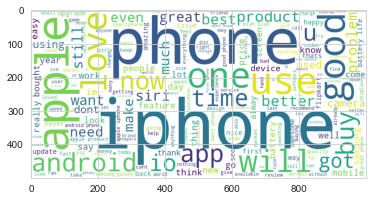

In [102]:
# word cloud
from wordcloud import WordCloud
word_cloud_string=WordCloud(background_color='White',width=1000,height=500).generate(df1_para)
plt.imshow(word_cloud_string)

In [103]:
df1['index']=range(0,len(df1))

<AxesSubplot:xlabel='index', ylabel='sentimental_scores'>

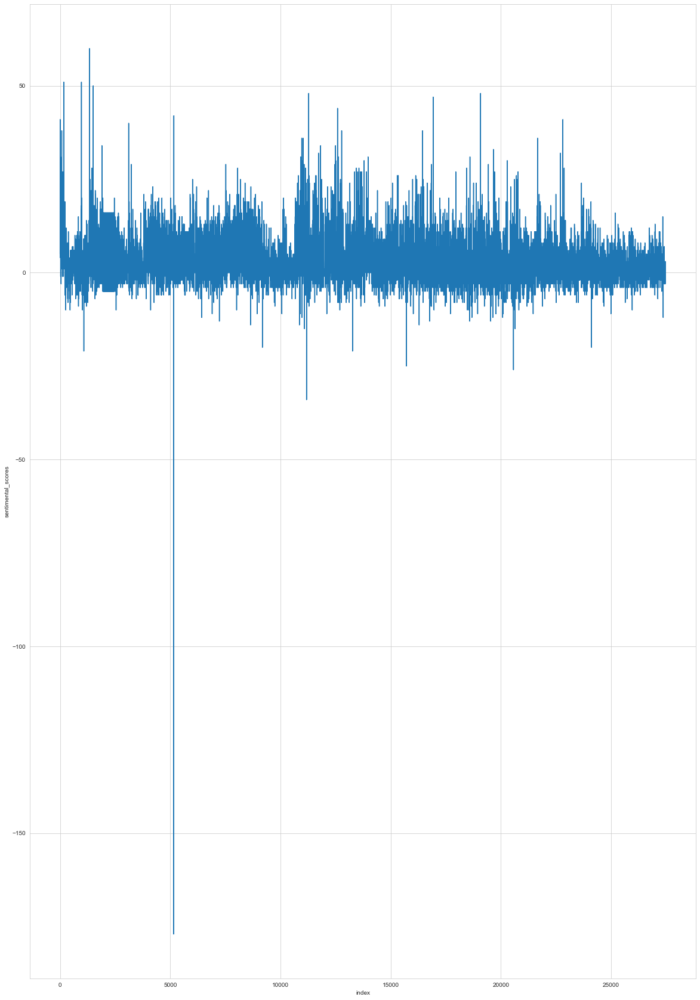

In [104]:
import seaborn as sns
plt.figure(figsize=(20,30))
sns.lineplot(y='sentimental_scores',x='index',data=df1)

# NaiveBayes

In [105]:
X=df2.iloc[:,:-1]
X

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,user,using,verizon,video,want,way,work,working,year,yes
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.0,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.0,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27464,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27465,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27466,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000


In [106]:
Y=df2.iloc[:,-1:]
Y

,Sentiment_Class
0,2
1,2
2,2
3,2
4,2
...,...
27463,1
27464,1
27465,1
27466,1


In [107]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 0.2) 

In [108]:
# lets check for the gaussian NB
from sklearn.naive_bayes import GaussianNB,MultinomialNB
igaunb=GaussianNB()
model1=igaunb.fit(X,Y)
y_pred_gauss=igaunb.predict(X_test) # predicting the yvalue for the testing data values

In [109]:
y_pred_gauss

array([2, 2, 2, ..., 1, 1, 2])

In [110]:
from sklearn.metrics import accuracy_score
accuracy_score_guass=accuracy_score(y_test,y_pred_gauss)


In [111]:
print("accuracy_score of the testing data",accuracy_score_guass)

accuracy_score of the testing data 0.659264652348016


In [112]:
# lets find the accuracy_score for the traing data
y_train_pred_gauss=igaunb.predict(X_train)
y_train_pred_gauss

array([0, 2, 0, ..., 2, 1, 0])

In [113]:
from sklearn.metrics import accuracy_score
accuracy_score_train=accuracy_score(y_train,y_train_pred_gauss)

In [114]:
print("accuracy_score of the testing data",accuracy_score_train)

accuracy_score of the testing data 0.6651952307272231


In [115]:
from sklearn.metrics import confusion_matrix
confusion_matrix=confusion_matrix(y_test,y_pred_gauss)   # for the testing datapri
confusion_matrix

array([[ 383,  310,   67],
       [ 250, 1200,   92],
       [ 549,  604, 2039]], dtype=int64)

In [116]:
from sklearn.metrics import classification_report
print(classification_report(y_pred_gauss,y_test))

              precision    recall  f1-score   support

           0       0.50      0.32      0.39      1182
           1       0.78      0.57      0.66      2114
           2       0.64      0.93      0.76      2198

    accuracy                           0.66      5494
   macro avg       0.64      0.61      0.60      5494
weighted avg       0.66      0.66      0.64      5494



# MULTINOMIAL NAIVE BYES

In [117]:
imulnb=MultinomialNB()
model2=imulnb.fit(X,Y)

In [118]:
y_mulnb_pred=imulnb.predict(X_test)

In [119]:
from sklearn.metrics import accuracy_score
accuracy_score_multi_test=accuracy_score(y_test,y_mulnb_pred)  # test data
print("accuracy_score",accuracy_score_multi_test)

accuracy_score 0.6305060065526028


In [120]:
# train data
y_mulnb_pred_train=imulnb.predict(X_train)

In [121]:
from sklearn.metrics import accuracy_score
accuracy_score_multi_train=accuracy_score(y_train,y_mulnb_pred_train)  # train data
print("accuracy_score",accuracy_score_multi_train)

accuracy_score 0.6269227268590152


In [122]:
from sklearn.metrics import confusion_matrix
confusion_matrix=confusion_matrix(y_test,y_mulnb_pred)   # for the testing datapri
confusion_matrix

array([[  88,  130,  542],
       [   5,  390, 1147],
       [   6,  200, 2986]], dtype=int64)

In [123]:
from sklearn.metrics import classification_report
print(classification_report(y_mulnb_pred,y_test))

              precision    recall  f1-score   support

           0       0.12      0.89      0.20        99
           1       0.25      0.54      0.34       720
           2       0.94      0.64      0.76      4675

    accuracy                           0.63      5494
   macro avg       0.43      0.69      0.44      5494
weighted avg       0.83      0.63      0.69      5494



# Feature extraction for sentimental analysis 2

# Vader_Lexicon

In [124]:
#lets perform TDFIF method for textblob data
from sklearn.feature_extraction.text import TfidfVectorizer
vect_tdif=TfidfVectorizer(max_features=100,max_df=0.5,stop_words='english',smooth_idf=True)
doc_tidf=vect_tdif.fit_transform(df_vader['review'])
naming_features=vect_tdif.get_feature_names()
dense=doc_tidf.todense()
denselist=dense.tolist()
df2_vader=pd.DataFrame(denselist,columns=naming_features)

In [125]:
df2_vader

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,user,using,verizon,video,want,way,work,working,year,yes
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.0,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.0,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27464,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27465,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27466,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000


# N-Grams

In [126]:
# bi-grams 
def get_top2_words(corpus,n=None):
    vector=CountVectorizer(ngram_range=(2,2),
                           max_features=2000).fit(corpus)
    bag_of_words=vector.transform(corpus)
    sum_words=bag_of_words.sum(axis=0)
    words_freq=[(word,sum_words[0,idx]) for word,idx in vector.vocabulary_.items()]
    words_freq= sorted(words_freq,key= lambda x: x[1],reverse=True)
    return words_freq[:n]


In [127]:
top2_words_vader = get_top2_words(df_vader["review"], n=200)
top2_words_df_vader=pd.DataFrame(top2_words_vader)
top2_words_df_vader.columns=["Bigram","freq"]
top2_words_df_vader.head()

,Bigram,freq
0,battery life,698
1,apple product,633
2,apple iphone,569
3,great phone,526
4,best phone,520


[Text(0, 0, 'battery life'),
 Text(1, 0, 'apple product'),
 Text(2, 0, 'apple iphone'),
 Text(3, 0, 'great phone'),
 Text(4, 0, 'best phone'),
 Text(5, 0, 'good phone'),
 Text(6, 0, 'love iphone'),
 Text(7, 0, 'easy use'),
 Text(8, 0, 'samsung galaxy'),
 Text(9, 0, 'buy iphone'),
 Text(10, 0, 'android phone'),
 Text(11, 0, 'love phone'),
 Text(12, 0, 'iphone iphone'),
 Text(13, 0, 'dont know'),
 Text(14, 0, 'first iphone'),
 Text(15, 0, 'much better'),
 Text(16, 0, 'new iphone'),
 Text(17, 0, 'love apple'),
 Text(18, 0, 'smart phone'),
 Text(19, 0, 'sim card')]

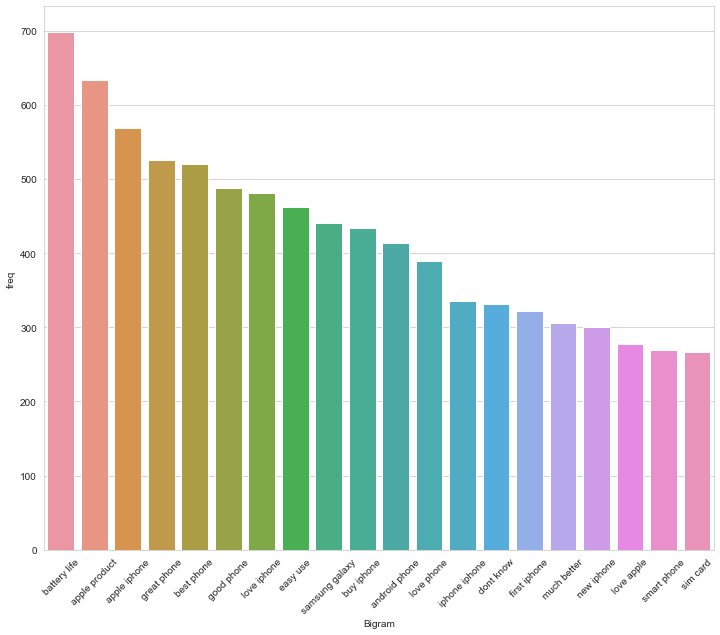

In [128]:
# bigram plot
import matplotlib.pyplot as plt
import seaborn as sns
top20_bigram_vader=top2_words_df_vader.iloc[0:20,:]
fig=plt.figure(figsize=(12,10))
plot=sns.barplot(x=top20_bigram_vader["Bigram"],y=top20_bigram_vader["freq"])
plot.set_xticklabels(rotation=45,labels=top20_bigram_vader["Bigram"])

In [129]:
# bi-grams 
def get_top3_words(corpus,n=None):
    vector=CountVectorizer(ngram_range=(3,3),
                           max_features=2000).fit(corpus)
    bag_of_words=vector.transform(corpus)
    sum_words=bag_of_words.sum(axis=0)
    words_freq=[(word,sum_words[0,idx]) for word,idx in vector.vocabulary_.items()]
    words_freq= sorted(words_freq,key= lambda x: x[1],reverse=True)
    return words_freq[:n]


In [130]:
top3_words_vader = get_top3_words(df_vader["review"], n=200)
top3_words_df_vader=pd.DataFrame(top3_words_vader)
top3_words_df_vader.columns=["Bigram","freq"]
top3_words_df_vader.head()

,Bigram,freq
0,best phone ever,153
1,love apple product,113
2,international gsm capability,104
3,iphone samsung galaxy,71
4,iphone best phone,68


[Text(0, 0, 'best phone ever'),
 Text(1, 0, 'love apple product'),
 Text(2, 0, 'international gsm capability'),
 Text(3, 0, 'iphone samsung galaxy'),
 Text(4, 0, 'iphone best phone'),
 Text(5, 0, 'phone first iphone'),
 Text(6, 0, 'make phone call'),
 Text(7, 0, 'really great phone'),
 Text(8, 0, 'really love phone'),
 Text(9, 0, 'never go back'),
 Text(10, 0, 'dual core processor'),
 Text(11, 0, 'like brand new'),
 Text(12, 0, 'hate iti hate'),
 Text(13, 0, 'please tell apple'),
 Text(14, 0, 'iti hate iti'),
 Text(15, 0, 'apple make new'),
 Text(16, 0, 'sim card buy'),
 Text(17, 0, 'love phone first'),
 Text(18, 0, 'phone everything work'),
 Text(19, 0, 'phone easy use')]

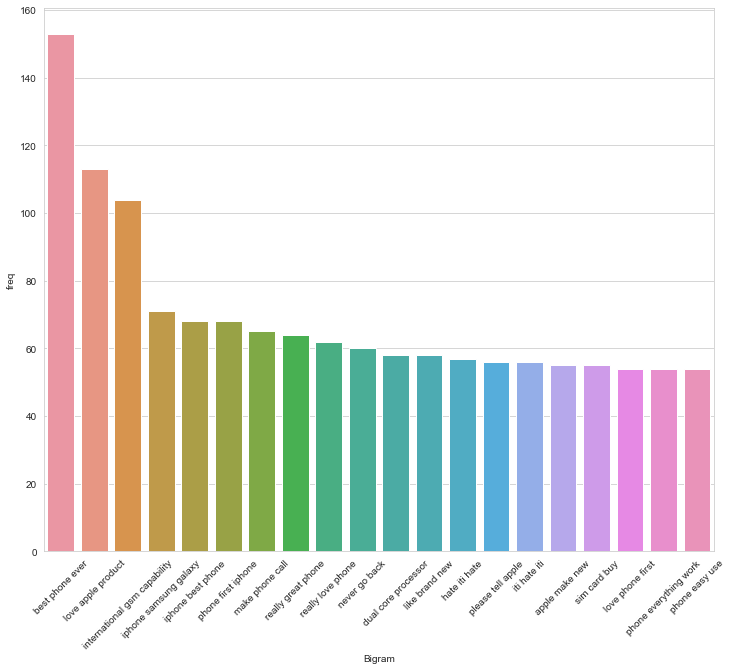

In [131]:
# bigram plot
import matplotlib.pyplot as plt
import seaborn as sns
top30_bigram_vader=top3_words_df_vader.iloc[0:20,:]
fig=plt.figure(figsize=(12,10))
plot=sns.barplot(x=top30_bigram_vader["Bigram"],y=top30_bigram_vader["freq"])
plot.set_xticklabels(rotation=45,labels=top30_bigram_vader["Bigram"])

# sentimental Analysis
# importing Afinn dataset

In [132]:
afinn=pd.read_csv("Afinn.csv.xls")

In [133]:
afinn.head()

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2


In [134]:
words=[]
for i in affin.word:
    j=i.split('\t')
    words.append(j[0])
words

['abandon',
 'abandoned',
 'abandons',
 'abducted',
 'abduction',
 'abductions',
 'abhor',
 'abhorred',
 'abhorrent',
 'abhors',
 'abilities',
 'ability',
 'aboard',
 'absentee',
 'absentees',
 'absolve',
 'absolved',
 'absolves',
 'absolving',
 'absorbed',
 'abuse',
 'abused',
 'abuses',
 'abusive',
 'accept',
 'accepted',
 'accepting',
 'accepts',
 'accident',
 'accidental',
 'accidentally',
 'accidents',
 'accomplish',
 'accomplished',
 'accomplishes',
 'accusation',
 'accusations',
 'accuse',
 'accused',
 'accuses',
 'accusing',
 'ache',
 'achievable',
 'aching',
 'acquit',
 'acquits',
 'acquitted',
 'acquitting',
 'acrimonious',
 'active',
 'adequate',
 'admire',
 'admired',
 'admires',
 'admiring',
 'admit',
 'admits',
 'admitted',
 'admonish',
 'admonished',
 'adopt',
 'adopts',
 'adorable',
 'adore',
 'adored',
 'adores',
 'advanced',
 'advantage',
 'advantages',
 'adventure',
 'adventures',
 'adventurous',
 'affected',
 'affection',
 'affectionate',
 'afflicted',
 'affronted',

In [135]:
affin["words"]=words
affin.head(10)

,word,value,words
0,abandon,-2,abandon
1,abandoned,-2,abandoned
2,abandons,-2,abandons
3,abducted,-2,abducted
4,abduction,-2,abduction
5,abductions,-2,abductions
6,abhor,-3,abhor
7,abhorred,-3,abhorred
8,abhorrent,-3,abhorrent
9,abhors,-3,abhors


In [136]:
affinity_scores=affin.set_index(["words"])["value"].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [137]:
nlp = spacy.load("en_core_web_sm")
sentiment_lexicon = affinity_scores

def calculate_sentiment(text: str = None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_, 0)
    return sent_score

In [138]:
df_vader["sentimental_scores"]=df_vader['review'].apply(calculate_sentiment)
df_vader.head(10)

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,neg_senti_scre,neu_senti_scre,pos_senti_scre,compound,nb_chars,nb_words,sentimental_scores
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,0.000,0.599,0.401,0.8271,103,16,5
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,0.104,0.607,0.289,0.9543,478,70,16
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,0.061,0.659,0.280,0.9923,1087,157,41
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,0.038,0.660,0.302,0.9906,747,123,23
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,0.032,0.671,0.297,0.9944,1112,166,27
5,since last month using iphone attractive look ...,0,since last months using iphone attractive look...,since last months using iphone attractive look...,0.715516,0.453452,0.089,0.450,0.462,0.9769,299,43,19
6,iphone received w retail genuine proper bill d...,0,iphone received ws retail genuine proper bill ...,iphone received ws retail genuine proper bill ...,0.452273,0.084091,0.062,0.774,0.164,0.9510,1026,153,11
7,genuine sealed year apple warranty checked ser...,0,genuine sealed year apple warranty checked ser...,genuine sealed year apple warranty checked ser...,0.550909,0.607273,0.000,0.638,0.362,0.9100,176,26,7
8,worth extra buck get iphone samsung galaxy sti...,0,worth extra bucks iphone samsung galaxy want b...,worth extra bucks get iphone samsung galaxy st...,0.250758,0.147727,0.062,0.674,0.264,0.7096,177,28,9
9,recently purchased phone working properly batt...,0,recently purchased phone working properly batt...,recently purchased phone working properly batt...,0.366667,0.091667,0.000,0.662,0.338,0.8481,167,24,7


In [139]:
df_vader["word_counts"]=df_vader["review"].str.split().apply(len)
df_vader["word_counts"]

0         16
1         70
2        157
3        123
4        166
        ... 
27463      0
27464      2
27465      2
27466      1
27467     12
Name: word_counts, Length: 27468, dtype: int64

<AxesSubplot:xlabel='sentimental_scores', ylabel='Density'>

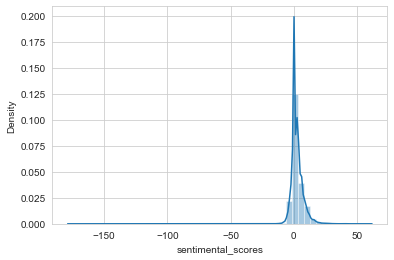

In [140]:
import seaborn as sns
sns.distplot(df_vader["sentimental_scores"])

In [141]:
df_vader.sentimental_scores.min()

-177

In [142]:
df_vader.sentimental_scores.max()

60

In [143]:
df_vader['Sentiment_Class'] = pd.cut(x=df_vader['sentimental_scores'],bins=[-976, -1, 0, 128], 
                                    labels=['Negative','Neutral','Positive'], right = True)

In [144]:
df_vader.head()

,review,stopwords,clean_review,wfeq_wostop,subjectivity,polarity,neg_senti_scre,neu_senti_scre,pos_senti_scre,compound,nb_chars,nb_words,sentimental_scores,word_counts,Sentiment_Class
0,good phone wrost prize reduction like post go ...,0,good phone wrost prize reduction like post ahe...,good phone wrost prize reduction like post go ...,0.675000,0.350000,0.000,0.599,0.401,0.8271,103,16,5,16,Positive
1,absolutely amazing device actually first io de...,0,absolutely amazing device actually first ios d...,absolutely amazing device actually first ios d...,0.550672,0.236911,0.104,0.607,0.289,0.9543,478,70,16,70,Positive
2,always wanted buy iphone great looking glass b...,0,always wanted buy iphone great looking glass b...,always wanted buy iphone great looking glass b...,0.517613,0.336951,0.061,0.659,0.280,0.9923,1087,157,41,157,Positive
3,iphone previous one iphone ya cost high demand...,0,iphone previous iphone ya cost high demands br...,iphone previous one iphone ya cost high demand...,0.456004,0.277188,0.038,0.660,0.302,0.9906,747,123,23,123,Positive
4,yes old discontinued dont think everyone told ...,0,yes old discontinued dont think everyone told ...,yes old discontinued dont think everyone told ...,0.520487,0.193972,0.032,0.671,0.297,0.9944,1112,166,27,166,Positive


In [145]:
df_vader['Sentiment_Class'].value_counts()

Positive    15846
Neutral      7655
Negative     3967
Name: Sentiment_Class, dtype: int64

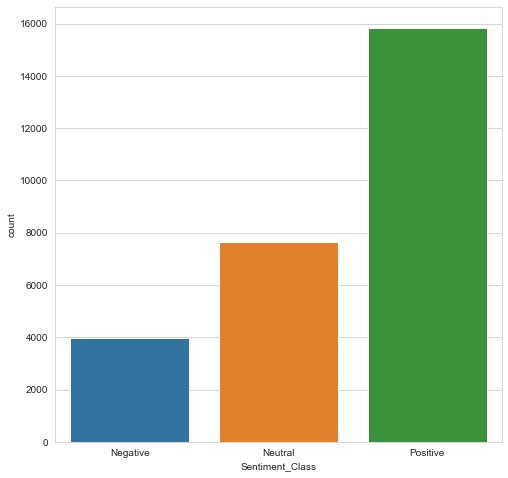

In [146]:
plt.figure(figsize=(8,8))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Class", data=df_vader)

# using label_encoder for the target variable

In [147]:
from sklearn.preprocessing import LabelEncoder

In [148]:
lm=LabelEncoder()
df2_vader["Sentiment_Class"]=lm.fit_transform(df_vader["Sentiment_Class"])
df2_vader.head()

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,using,verizon,video,want,way,work,working,year,yes,Sentiment_Class
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,2
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000,2
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726,2
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000,2
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658,2


In [149]:
X=df2_vader.iloc[:,:-1]
X

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,user,using,verizon,video,want,way,work,working,year,yes
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.0,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.0,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27464,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27465,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27466,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000


In [150]:
Y=df2_vader.iloc[:,-1:]
Y

,Sentiment_Class
0,2
1,2
2,2
3,2
4,2
...,...
27463,1
27464,1
27465,1
27466,1


# Model_building

In [151]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 0.2)

In [152]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score as ac
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [153]:
X_train.shape

(21974, 100)

In [154]:
X.shape

(27468, 100)

In [155]:
y_train.shape

(21974, 1)

In [156]:
Y.shape

(27468, 1)

In [157]:
model=DecisionTreeClassifier( criterion='gini', min_samples_split=5)
model=model.fit(X_train,y_train)

In [158]:
y_pred=model.predict(X_test)

In [159]:
accuracy=ac(y_test,y_pred)
accuracy

0.7238805970149254

# Logistic Regression

In [196]:
classifier_vader=LogisticRegression(max_iter=2000)
classifier_vader.fit(X_train,y_train)

LogisticRegression(max_iter=2000)

In [197]:
y_pred_logistic=classifier_vader.predict(X_test)
y_pred_logistic

array([1, 2, 1, ..., 0, 2, 1])

In [198]:
ac(y_pred_logistic,y_test)

0.7510010921004733

In [199]:
from sklearn.metrics import confusion_matrix
confusion_matrix (y_pred_logistic,y_test)

array([[ 242,   58,   73],
       [ 297, 1223,  434],
       [ 254,  252, 2661]], dtype=int64)

In [200]:
print(classification_report(y_pred_logistic,y_test))

              precision    recall  f1-score   support

           0       0.31      0.65      0.42       373
           1       0.80      0.63      0.70      1954
           2       0.84      0.84      0.84      3167

    accuracy                           0.75      5494
   macro avg       0.65      0.70      0.65      5494
weighted avg       0.79      0.75      0.76      5494



# Random forest

In [201]:
from sklearn.ensemble import RandomForestClassifier
model_vader_random=RandomForestClassifier()
y_pred_vader_random=model.predict(X_test)

In [202]:
y_pred_vader_random

array([1, 2, 1, ..., 2, 2, 1])

In [203]:
accuracy=ac(y_test,y_pred_vader_random)
accuracy

0.8649435748088824

# WordCloud

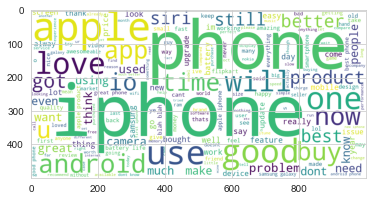

In [204]:
# word cloud
from wordcloud import WordCloud
word_cloud_string=WordCloud(background_color='White',width=1000,height=500).generate(df1_para)
plt.imshow(word_cloud_string)

In [205]:
df_vader['index']=range(0,len(df_vader))

<AxesSubplot:xlabel='index', ylabel='sentimental_scores'>

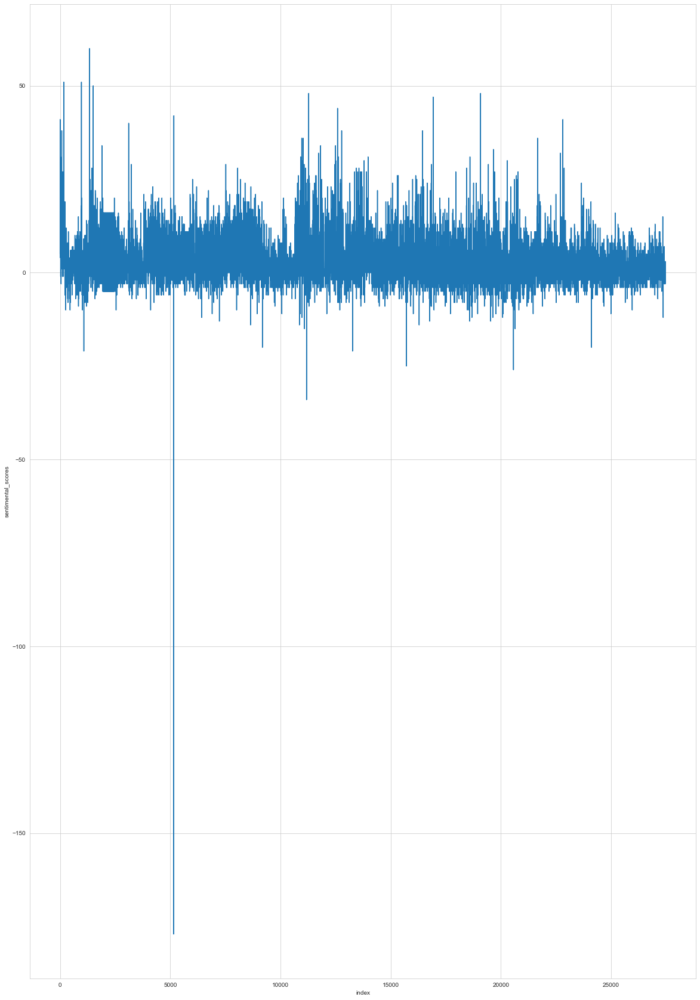

In [206]:
import seaborn as sns
plt.figure(figsize=(20,30))
sns.lineplot(y='sentimental_scores',x='index',data=df_vader)

# Naive Bayes

In [207]:
X=df2_vader.iloc[:,:-1]
X

,amazing,android,anonymous,app,apple,apps,awesome,bad,battery,best,...,user,using,verizon,video,want,way,work,working,year,yes
0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
1,0.198302,0.156612,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.169796,0.0,0.331807,0.0,0.0,0.000000
2,0.000000,0.265715,0.0,0.000000,0.064083,0.000000,0.000000,0.0,0.086881,0.17191,...,0.0,0.183233,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.118726
3,0.000000,0.000000,0.0,0.192453,0.208325,0.159291,0.179458,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.156087,0.0,0.000000,0.0,0.0,0.000000
4,0.000000,0.000000,0.0,0.000000,0.000000,0.115830,0.130495,0.0,0.000000,0.00000,...,0.0,0.108286,0.0,0.0,0.113500,0.0,0.000000,0.0,0.0,0.280658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27463,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27464,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27465,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000
27466,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000


In [208]:
Y=df2_vader.iloc[:,-1:]
Y

,Sentiment_Class
0,2
1,2
2,2
3,2
4,2
...,...
27463,1
27464,1
27465,1
27466,1


In [209]:
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 0.2)

In [210]:
# lets check for the gaussian NB
from sklearn.naive_bayes import GaussianNB,MultinomialNB
igaunb=GaussianNB()
model1=igaunb.fit(X,Y)
y_pred_gauss=igaunb.predict(X_test) # predicting the yvalue for the testing data values

In [211]:
y_pred_gauss

array([0, 0, 1, ..., 1, 1, 0])

In [212]:
from sklearn.metrics import accuracy_score
accuracy_score=accuracy_score(y_test,y_pred_gauss)

In [213]:
print("accuracy_score of the testing data",accuracy_score)

accuracy_score of the testing data 0.660174736075719


In [214]:
# lets find the accuracy_score for the traing data
y_train_pred_gauss=igaunb.predict(X_train)
y_train_pred_gauss

array([1, 1, 1, ..., 2, 1, 1])

In [215]:
from sklearn.metrics import accuracy_score
accuracy_score_train=accuracy_score(y_train,y_train_pred_gauss)

In [216]:
print("accuracy_score of the testing data",accuracy_score_train)

accuracy_score of the testing data 0.6649676890871029


In [217]:
from sklearn.metrics import confusion_matrix
confusion_matrix=confusion_matrix(y_test,y_pred_gauss)   # for the testing datapri
confusion_matrix

array([[ 373,  331,   78],
       [ 207, 1191,  102],
       [ 520,  629, 2063]], dtype=int64)

In [218]:
from sklearn.metrics import classification_report
print(classification_report(y_pred_gauss,y_test))

              precision    recall  f1-score   support

           0       0.48      0.34      0.40      1100
           1       0.79      0.55      0.65      2151
           2       0.64      0.92      0.76      2243

    accuracy                           0.66      5494
   macro avg       0.64      0.60      0.60      5494
weighted avg       0.67      0.66      0.64      5494



# Multinomial Naive Bayes

In [219]:
imulnb=MultinomialNB()
model2=imulnb.fit(X,Y)

In [220]:
y_mulnb_pred=imulnb.predict(X_test)

In [221]:
from sklearn.metrics import accuracy_score
accuracy_score=accuracy_score(y_test,y_mulnb_pred)  # test data
print("accuracy_score",accuracy_score)

accuracy_score 0.6376046596286858


In [222]:
# train data
y_mulnb_pred_train=imulnb.predict(X_train)

In [223]:
from sklearn.metrics import accuracy_score
accuracy_score=accuracy_score(y_train,y_mulnb_pred_train)  # test data
print("accuracy_score",accuracy_score)

accuracy_score 0.6251479020660781


In [224]:
from sklearn.metrics import confusion_matrix
confusion_matrix=confusion_matrix(y_test,y_mulnb_pred)   # for the testing datapri
confusion_matrix

array([[  91,  140,  551],
       [   9,  384, 1107],
       [   4,  180, 3028]], dtype=int64)

In [225]:
from sklearn.metrics import classification_report
print(classification_report(y_mulnb_pred,y_test))

              precision    recall  f1-score   support

           0       0.12      0.88      0.21       104
           1       0.26      0.55      0.35       704
           2       0.94      0.65      0.77      4686

    accuracy                           0.64      5494
   macro avg       0.44      0.69      0.44      5494
weighted avg       0.84      0.64      0.70      5494



# compairing th emodel accuracy

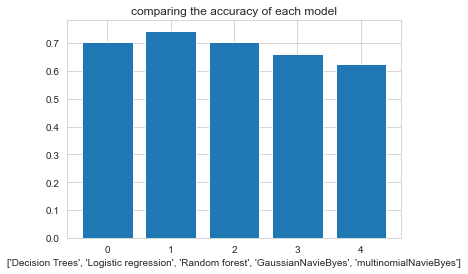

In [226]:
import seaborn as sns
import matplotlib.pyplot as plt
Accuracy = [accuracy_decision,accuracy_logistic,accuracy_random,accuracy_score_guass,accuracy_score]
Methods = ['Decision Trees', 'Logistic regression','Random forest','GaussianNavieByes','multinomialNavieByes']
Accuracy_pos = np.arange(len(Methods))
plt.bar(Accuracy_pos, Accuracy)
plt.xlabel(Methods)
plot.set_autoscalex_on(Methods)
plt.title('comparing the accuracy of each model')
plt.show()

# Create a pickle file for Deployment Purpose

In [227]:
import pickle
from pickle import dump
from pickle import load

In [228]:
filename='final_df.save'
pickle.dump(classifier_vader,open(filename,'wb'))

In [229]:
loaded_model=pickle.load(open('final_df.save','rb'))
loaded_model

LogisticRegression(max_iter=2000)

In [232]:
# saving the file into dataset
final_df=df2_vader


In [234]:
final_df.to_csv("final_file.csv")